In [2]:
from model_2 import *
from data_2 import *
import matplotlib.pyplot as plt
import numpy as np

Using TensorFlow backend.


In [14]:
train_ids = np.arange(16)
print(train_ids)
train_generator = DataGenerator(train_ids, 'data/membrane/train/image', 'data/membrane/train/label', do_fft= False, batch_size=4)

validation_ids = np.arange(16, 20)
print(validation_ids)
validation_generator = DataGenerator(validation_ids, 'data/membrane/train/image', 'data/membrane/train/label', do_fft= False, batch_size=4)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15]
Initialized with 400 total IDs
[16 17 18 19]
Initialized with 100 total IDs


In [4]:
model = unet()
print(model.summary())

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 256, 256, 2)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 256, 256, 64) 1216        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 256, 256, 64) 36928       conv2d_1[0][0]                   
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 256, 256, 64) 256         conv2d_2[0][0]                   
____________________________________________________________________________________________

In [15]:
model.fit_generator(train_generator, validation_data=validation_generator, epochs=20)

Epoch 1/20
100/100 [==============================] - 20s 201ms/step - loss: 0.0437 - mean_squared_error: 0.0059 - val_loss: 0.0596 - val_mean_squared_error: 0.0066
Epoch 2/20
100/100 [==============================] - 20s 199ms/step - loss: 0.0397 - mean_squared_error: 0.0049 - val_loss: 0.0493 - val_mean_squared_error: 0.0050
Epoch 3/20
100/100 [==============================] - 20s 201ms/step - loss: 0.0367 - mean_squared_error: 0.0042 - val_loss: 0.0430 - val_mean_squared_error: 0.0046
Epoch 4/20
100/100 [==============================] - 20s 202ms/step - loss: 0.0340 - mean_squared_error: 0.0037 - val_loss: 0.0397 - val_mean_squared_error: 0.0046
Epoch 5/20
100/100 [==============================] - 20s 201ms/step - loss: 0.0342 - mean_squared_error: 0.0038 - val_loss: 0.0238 - val_mean_squared_error: 0.0038
Epoch 6/20
100/100 [==============================] - 20s 202ms/step - loss: 0.0317 - mean_squared_error: 0.0032 - val_loss: 0.0427 - val_mean_squared_error: 0.0039
Epoch 7/20

In [16]:
ii_gen = iter(validation_generator)

for i in range(2):
    X, y = next(ii_gen)

results = model.predict(X)
print(results.shape)

(4, 256, 256, 2)


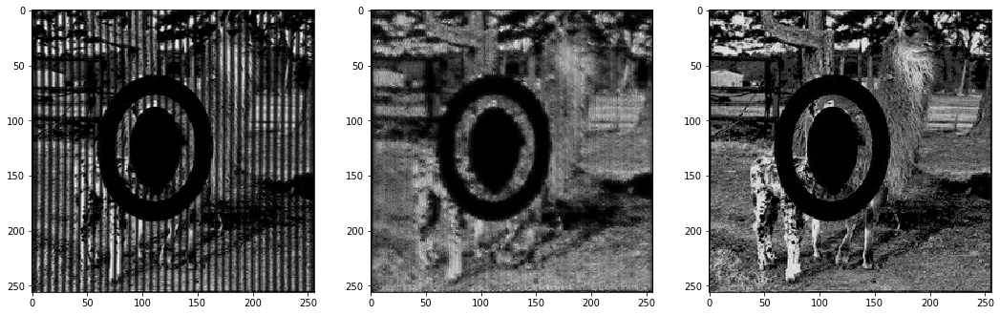

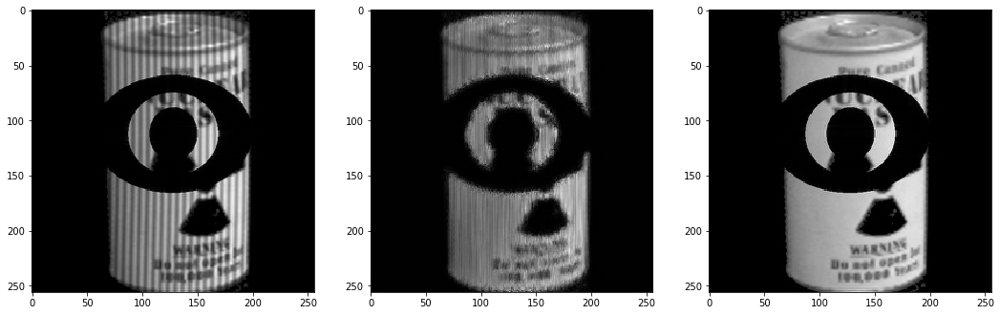

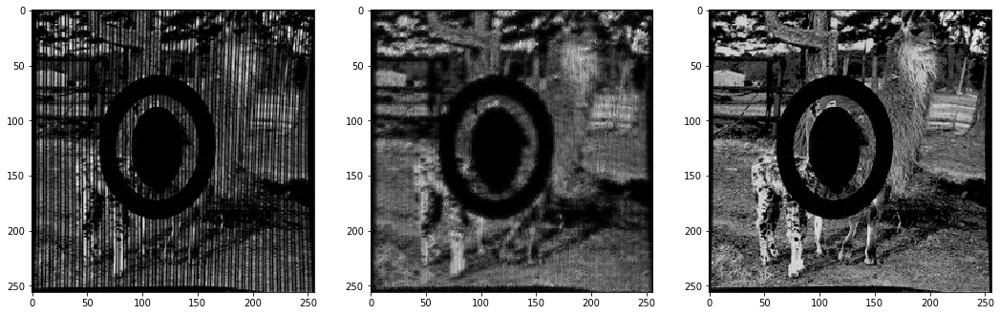

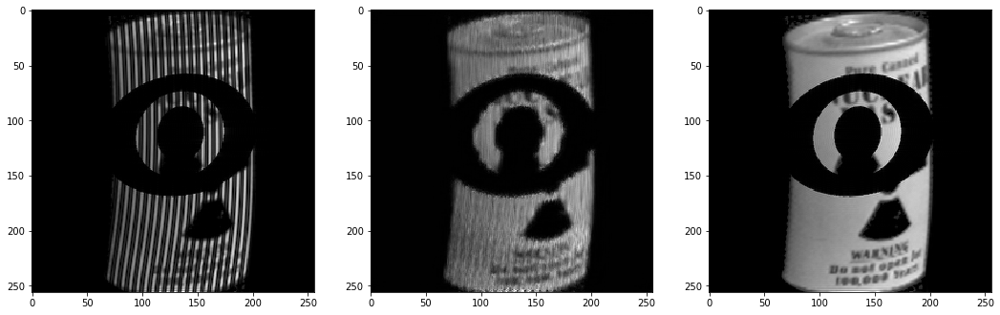

In [17]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.abs(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.abs(im_y)), cmap='gray')

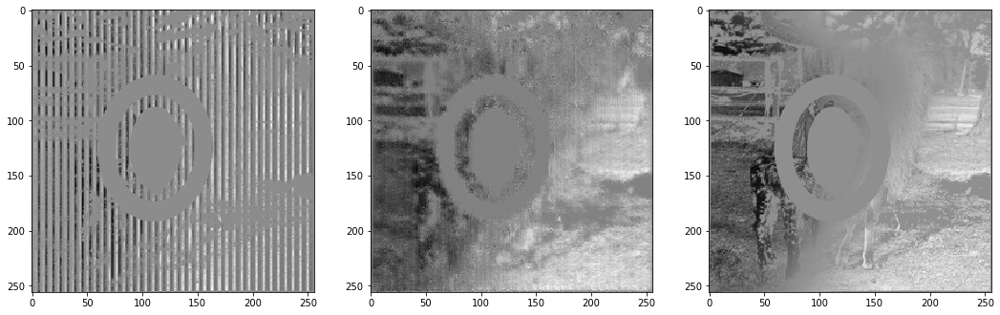

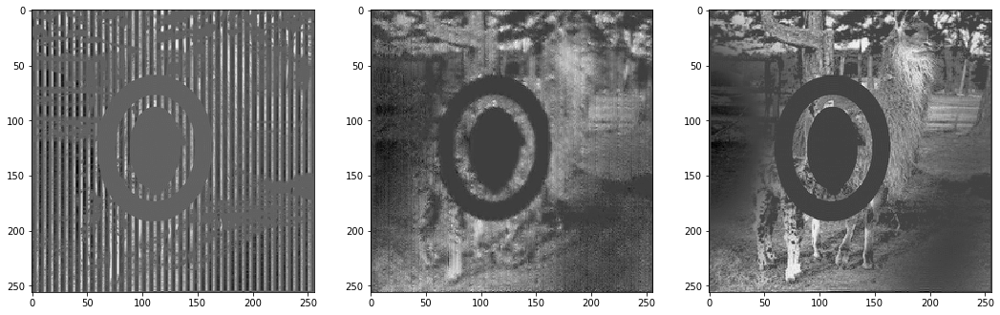

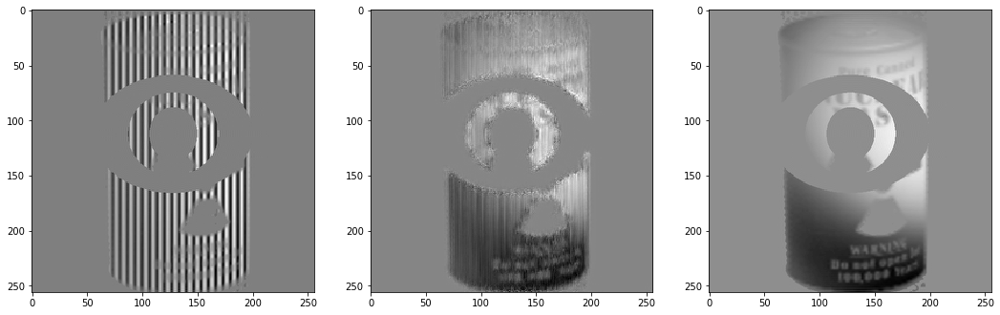

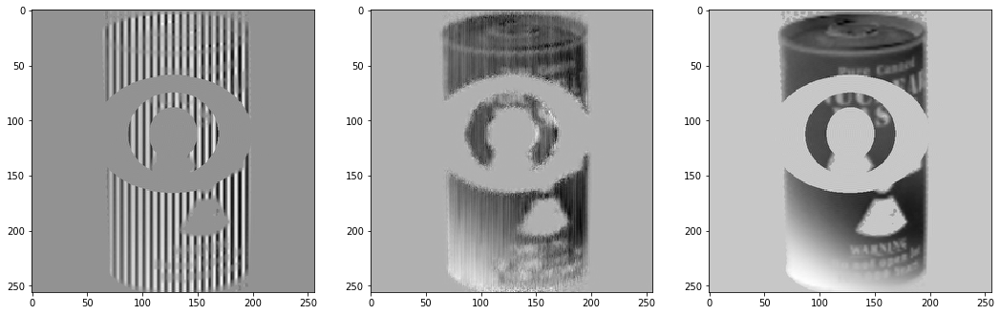

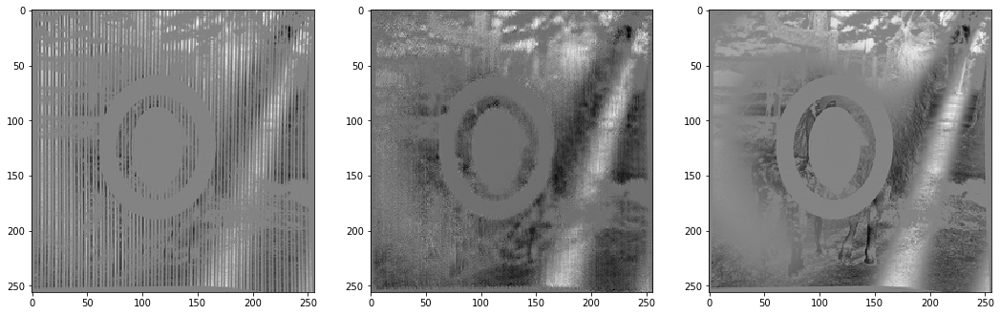

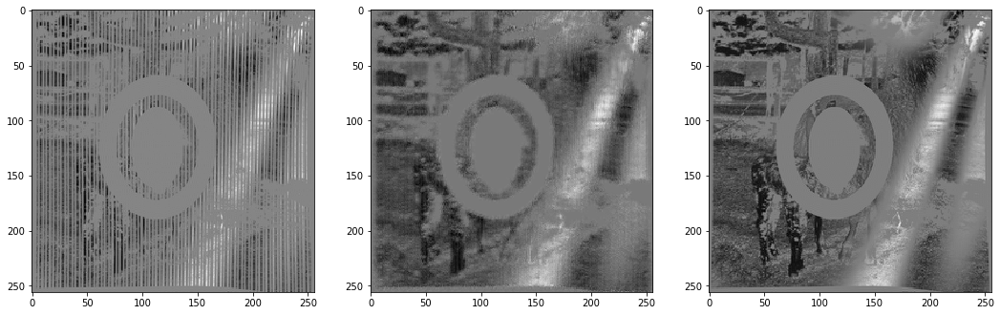

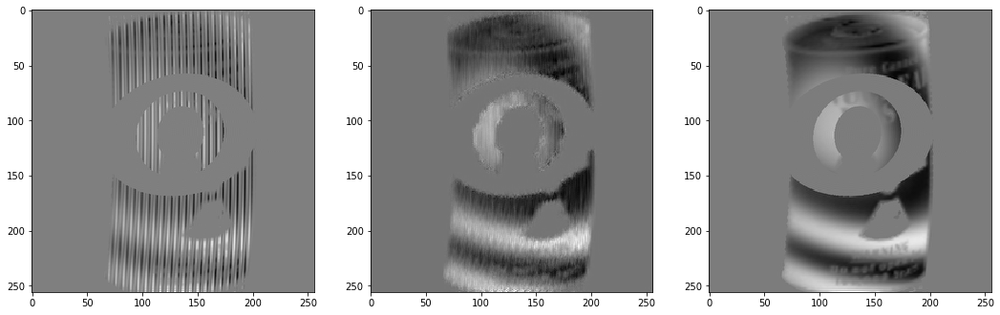

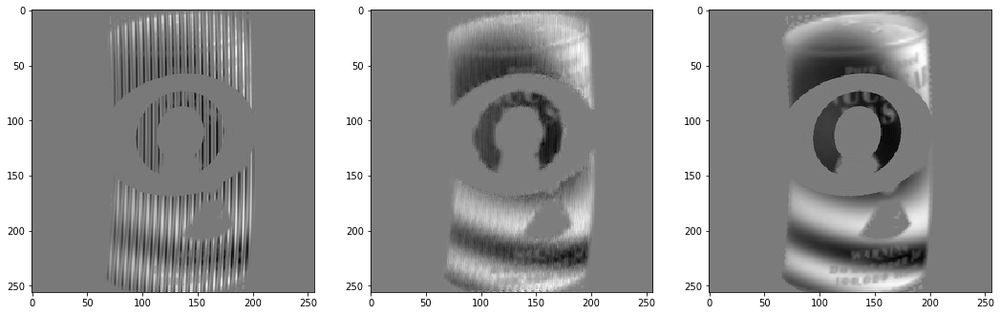

In [18]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.real(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.real(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.real(im_y)), cmap='gray')
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.imag(im_X)), cmap='gray')
    
    axs[0,1].imshow((np.imag(im_res)), cmap='gray')
    
    axs[0,2].imshow((np.imag(im_y)), cmap='gray')

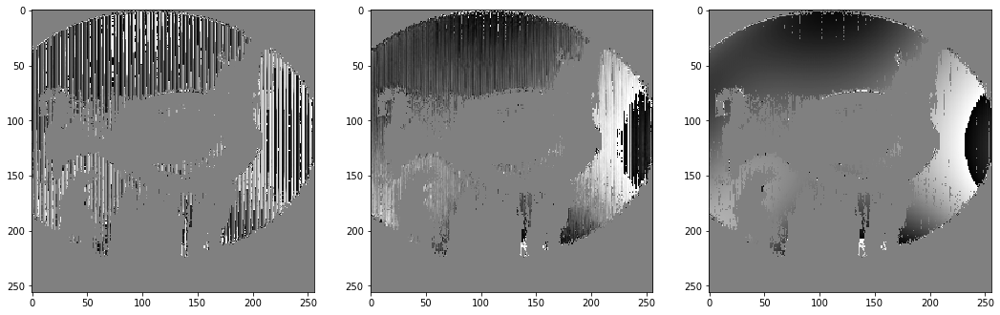

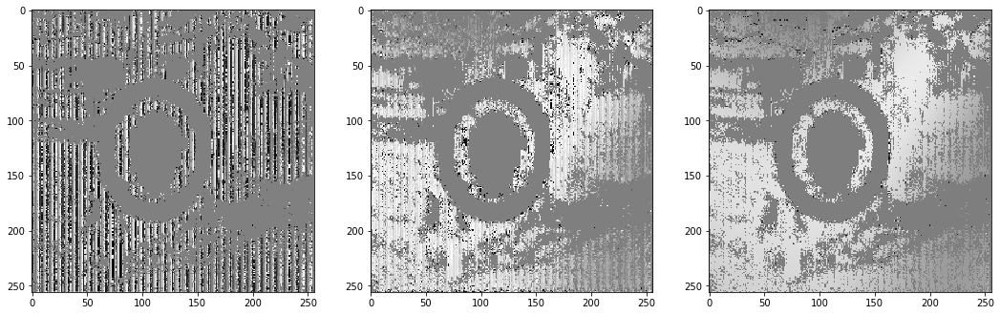

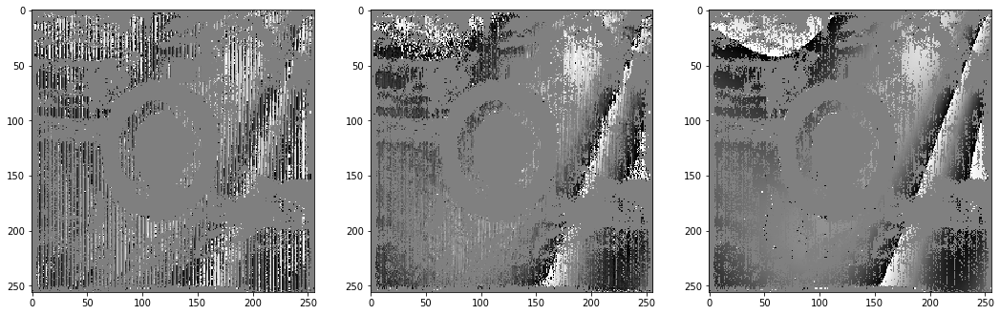

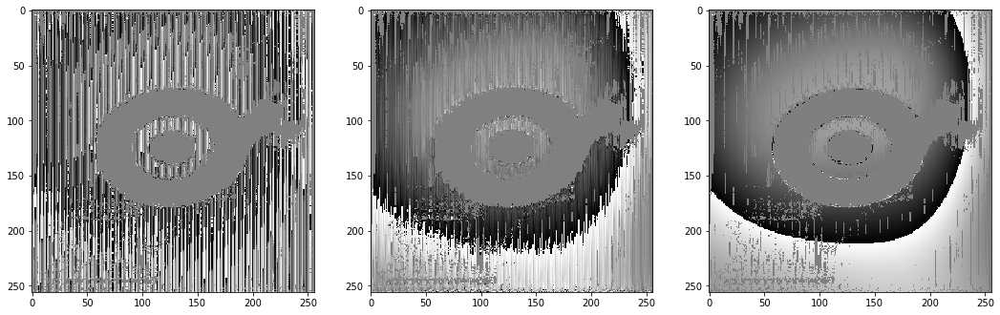

In [11]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    mask = np.abs(im_res) > 0.1
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((mask*np.angle(im_X)), cmap='gray')
    
    axs[0,1].imshow((mask*np.angle(im_res)), cmap='gray')
    
    axs[0,2].imshow((mask*np.angle(im_y)), cmap='gray')

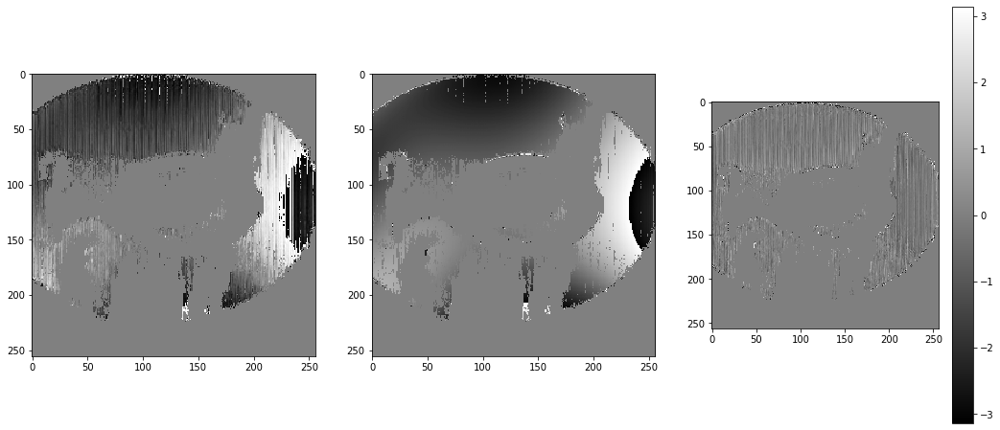

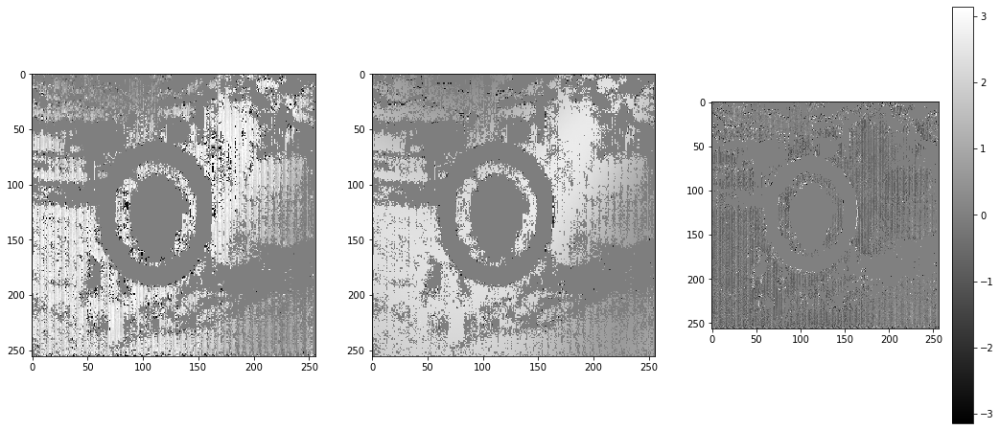

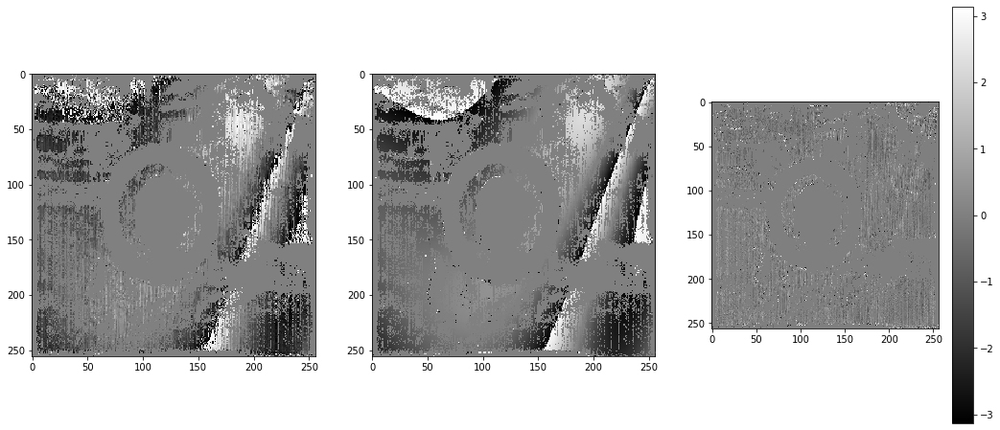

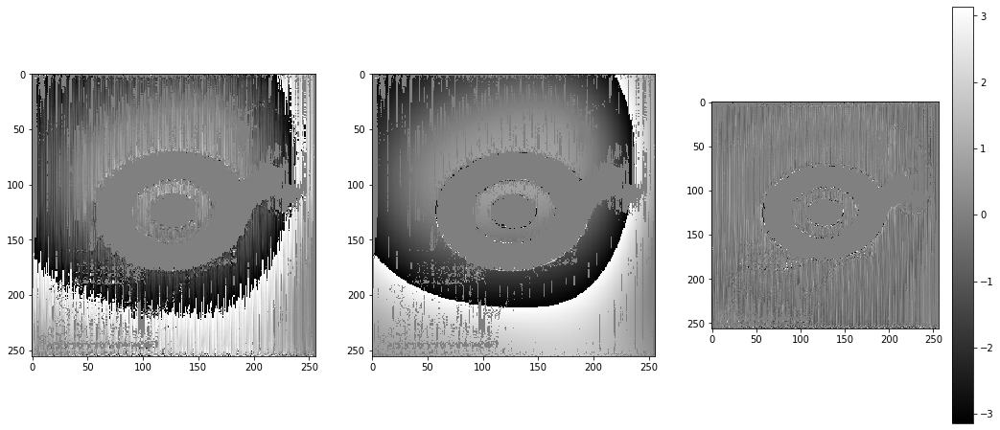

In [12]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    mask = np.abs(im_res) > 0.1
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    
    axs[0,0].imshow((mask*np.angle(im_res)), cmap='gray')
    
    axs[0,1].imshow((mask*np.angle(im_y)), cmap='gray')
    
    imsh = axs[0,2].imshow(mask*np.angle(im_y*np.exp(-1j*np.angle(im_res))), cmap='gray')
    fig.colorbar(imsh, ax=axs[0,2])

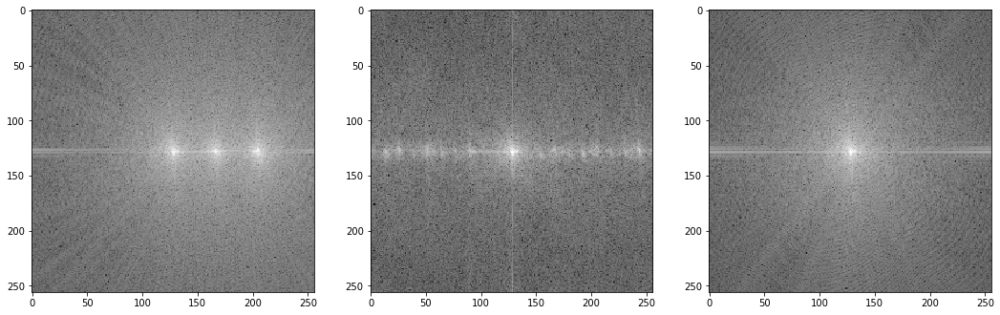

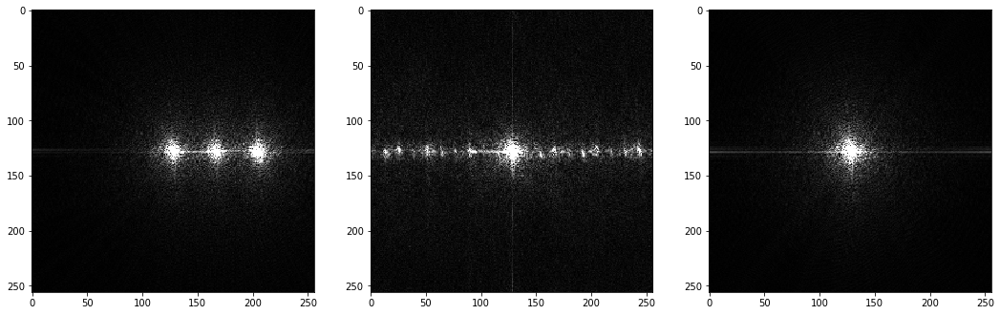

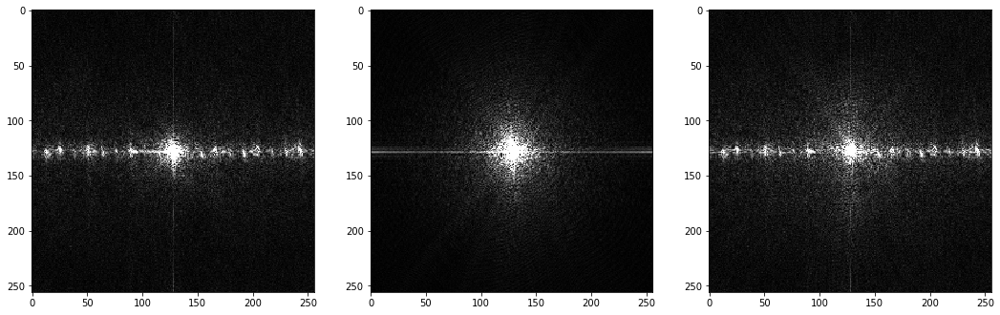

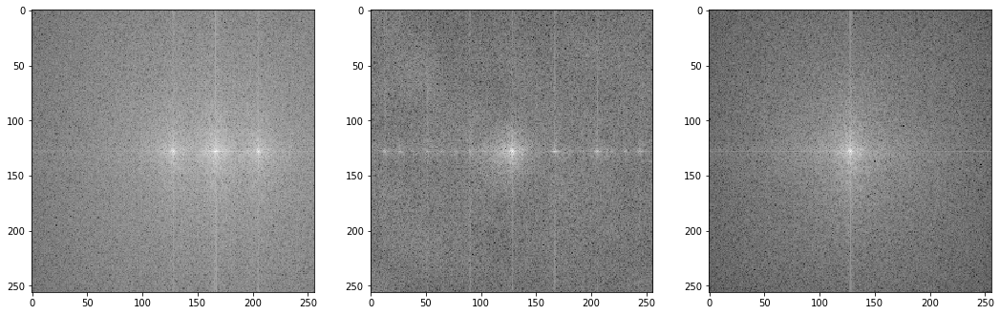

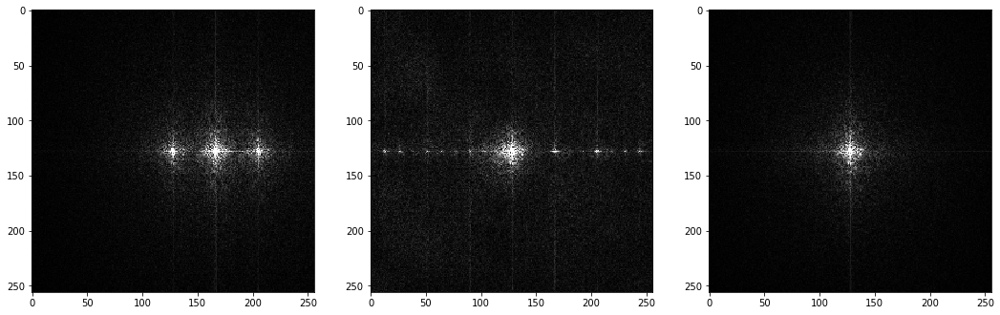

...

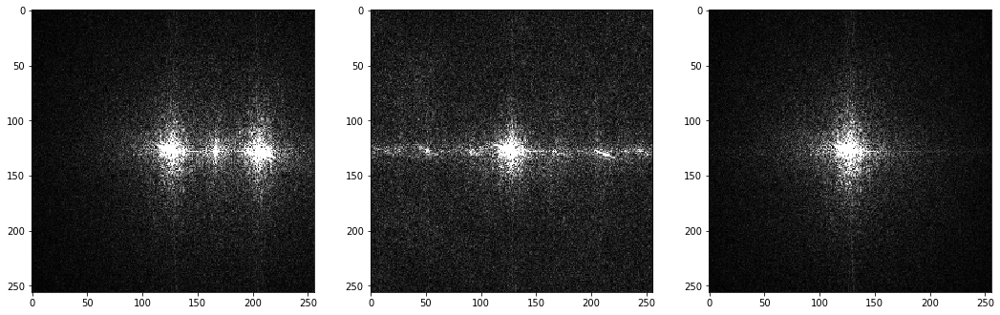

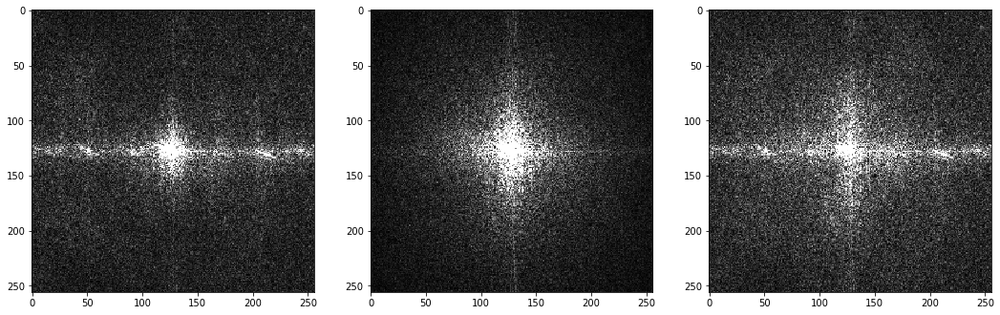

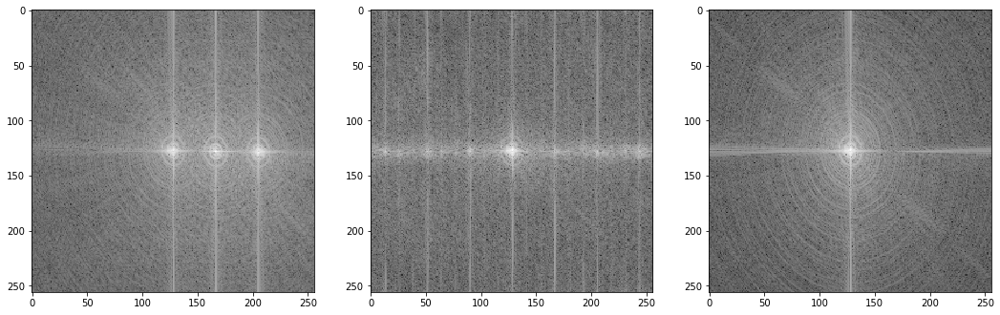

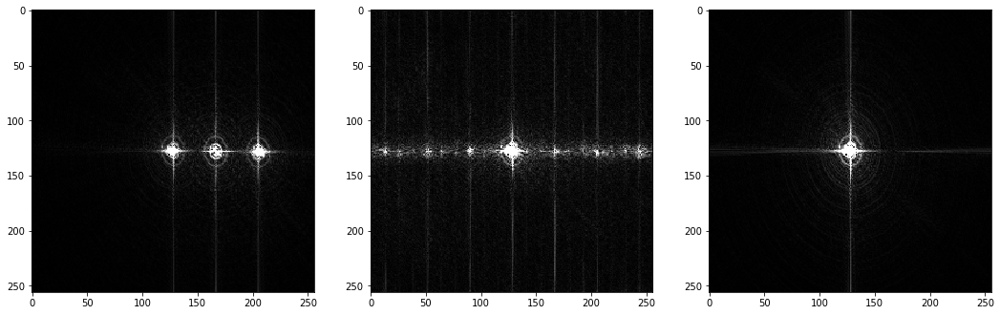

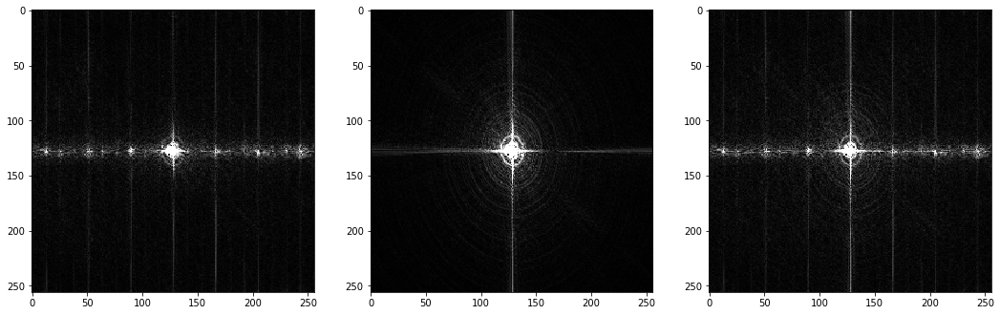

In [13]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    k_X = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_X)))
    k_res = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_res)))
    k_y = np.fft.ifftshift(np.fft.fft2(np.fft.fftshift(im_y)))
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow(np.log(np.abs(k_X)), cmap='gray')
    
    axs[0,1].imshow(np.log(np.abs(k_res)), cmap='gray')
    
    axs[0,2].imshow(np.log(np.abs(k_y)), cmap='gray')
    
    
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_X)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,1].imshow((np.abs(k_res)), cmap='gray', clim = (0, 0.05*np.abs(k_res).max()))
    
    axs[0,2].imshow((np.abs(k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_y).max()))
    
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_res)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,1].imshow((np.abs(k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))
    
    axs[0,2].imshow((np.abs(k_res-k_y)), cmap='gray', clim = (0, 0.05*np.abs(k_X).max()))

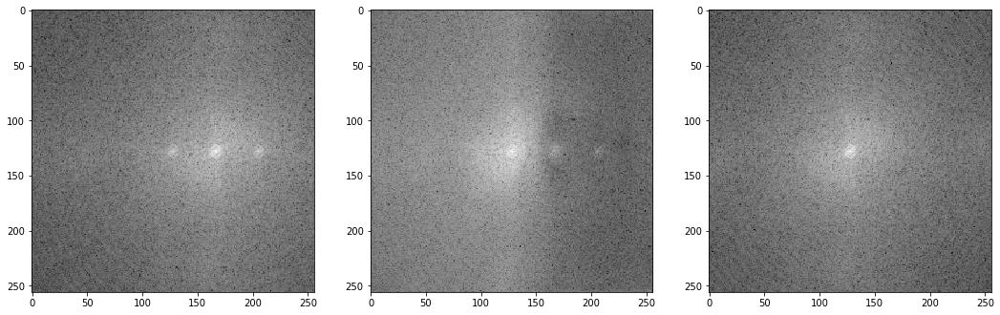

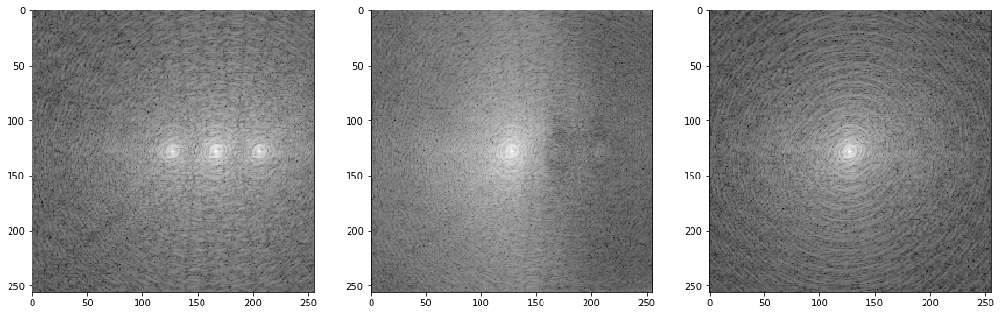

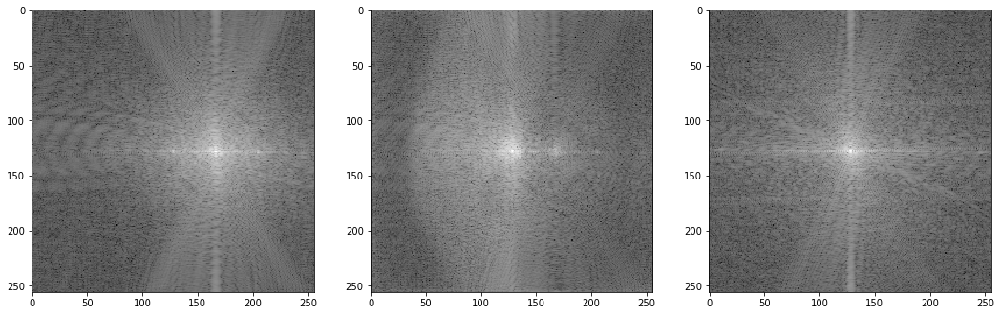

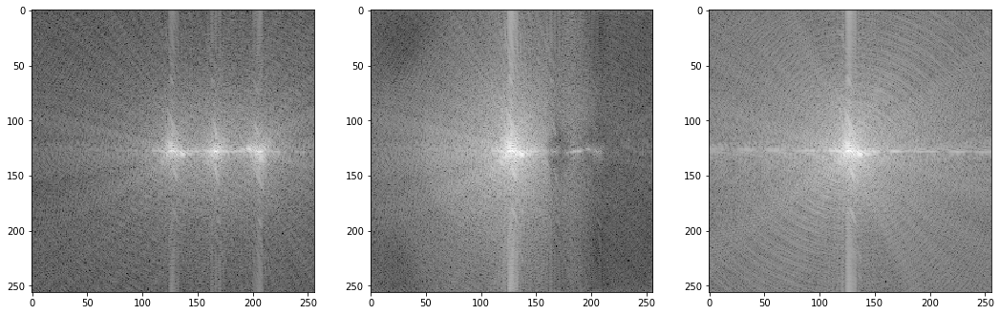

In [6]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow(np.log(np.abs(im_X)), cmap='gray')
    
    axs[0,1].imshow(np.log(np.abs(im_res)), cmap='gray')
    
    axs[0,2].imshow(np.log(np.abs(im_y)), cmap='gray')


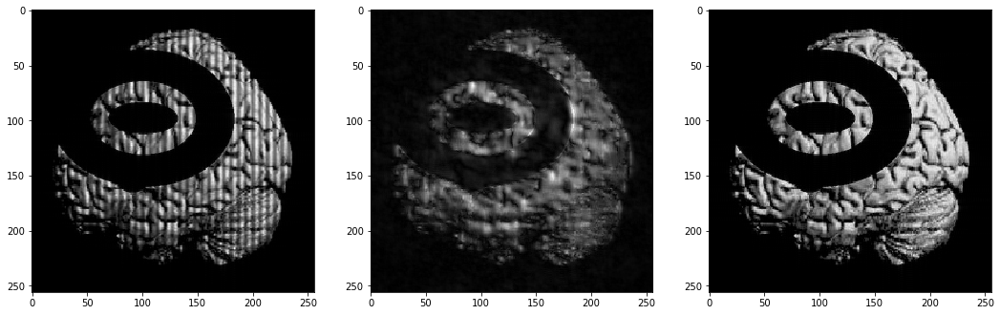

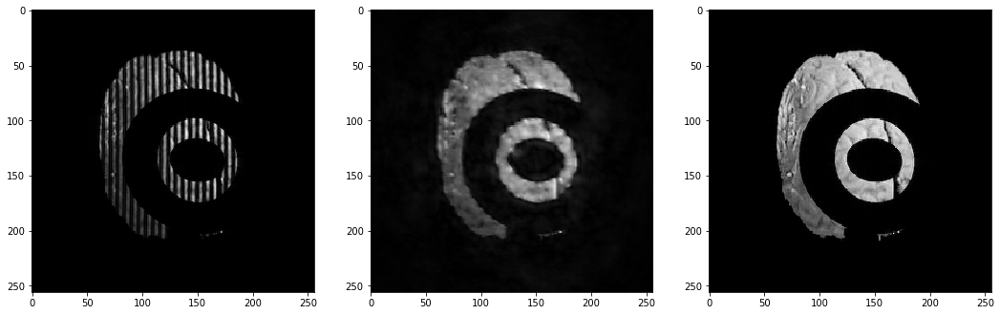

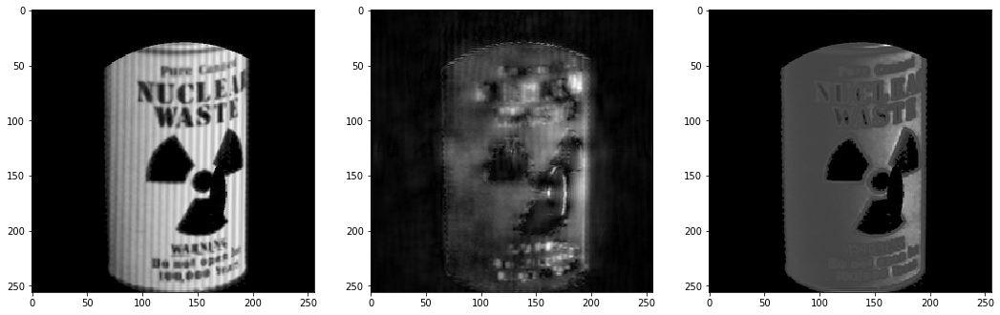

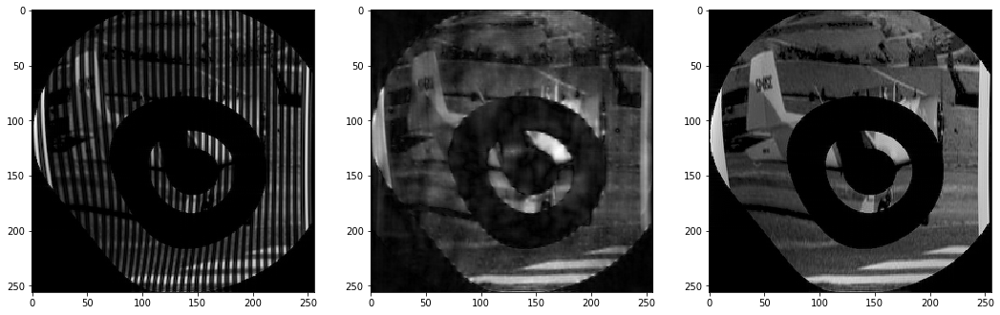

In [7]:
for j in range(4):
    im_X = X[j,:,:,0] + 1j * X[j,:,:,1]
    im_res = results[j,:,:,0] + 1j * results[j,:,:,1]
    im_y = y[j,:,:,0] + 1j * y[j,:,:,1]
    
    k_X = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_X)))
    k_res = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_res)))
    k_y = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(im_y)))
    
    fig, axs = plt.subplots(1, 3, squeeze=False, figsize=(18,8))
    
    axs[0,0].imshow((np.abs(k_X)), cmap='gray')
    
    axs[0,1].imshow((np.abs(k_res)), cmap='gray')
    
    axs[0,2].imshow((np.abs(k_y)), cmap='gray')

## Tuning ideas
* Use all timeframes together
  * As channels (3D convolutions will be too expensive)
* Operate in k-space
* Which loss function is best
* Operate in image space, but loss function in k-space
* Play with activation functions, where to use batch normalization, learning rate adjustments, batch size
* Check initial image normalization (zero mean, stdev = 1)

## Implement validation, test data
* Validate on different simulations
* Test on the cardiac simulation
* Eventually we will test on our acquired DENSE data (I need to prep it)